# Global Sensitivity Analysis of *PFSS $\to$ WSA $\to$ HUX* for CR2053

In [5]:
import sys, os
sys.path.append(os.path.abspath(os.path.join('..')))

In [6]:
import numpy as np 
import matplotlib.pyplot as plt
from mycolorpy import colorlist as mcp
import os
from scipy import stats
from model_chain import run_chain_of_models, get_ace_date
from SA_tools.sobol import estimate_sobol
import datetime as dt
from sunpy.coordinates.sun import carrington_rotation_time
import matplotlib
font = {'family' : 'serif',
        'size'   : 15}

matplotlib.rc('font', **font)
matplotlib.rc('xtick', labelsize=15) 
matplotlib.rc('ytick', labelsize=15) 

# Get ACE data

In [7]:
# set up carrington rotation
CR = "2053"
start_time = carrington_rotation_time(int(CR)).to_datetime()
end_time = carrington_rotation_time(int(CR)+1).to_datetime()

# get ace data
ACE_longitude, ACE_latitude, ACE_r, ACE_vr, ACE_obstime = get_ace_date(start_time=start_time, end_time=end_time)

# Directory with Results

In [8]:
# directory with results
dir_name = os.getcwd()[:-11] + "/SA_results/CR" + str(CR) + "/LHS"
# number of samples
N_curr = int(10**4)

In [9]:
YA = np.zeros((len(ACE_longitude), N_curr))
YB = np.zeros((len(ACE_longitude), N_curr))

In [10]:
for ii in range(N_curr):
    YA[:, ii] = np.load(dir_name + "/simulation_output/A" + str(ii) + "/vr_hux_sample_A" + str(ii) + ".npy")
    YB[:, ii] = np.load(dir_name + "/simulation_output/B" + str(ii) + "/vr_hux_sample_B" + str(ii) + ".npy")

# Ensemble Runs

In [11]:
std_A = np.std(YA, axis=1)
std_B = np.std(YB, axis=1)
mean_A = np.mean(YA, axis=1)
mean_B = np.mean(YB, axis=1)

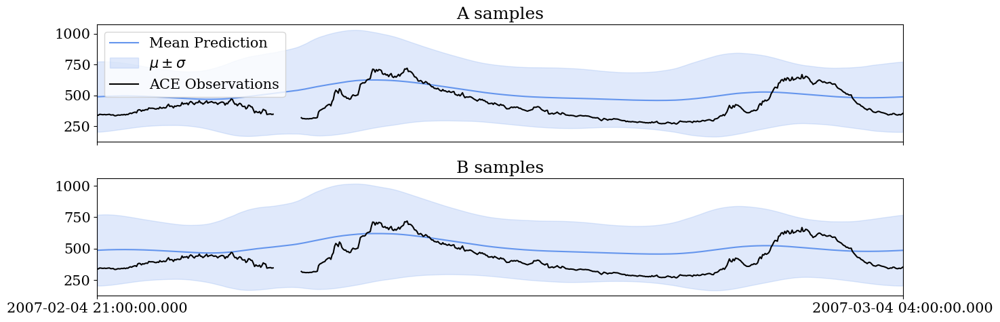

In [12]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(15, 5))
ax[0].plot(ACE_obstime.value, mean_A, c="cornflowerblue", label="Mean Prediction")
ax[1].plot(ACE_obstime.value, mean_B, c="cornflowerblue", label="Mean Prediction")
ax[0].fill_between(ACE_obstime.value, (mean_A-std_A), (mean_A+std_A), 
                   color='cornflowerblue', alpha=.2, label=r"$ \mu \pm \sigma$")
ax[0].plot(ACE_obstime.value, ACE_vr, c="black", label="ACE Observations")
ax[1].fill_between(ACE_obstime.value, (mean_B-std_B), (mean_B+std_B), 
                   color='cornflowerblue', alpha=.2, label=r"$ \mu \pm \sigma$")
ax[1].plot(ACE_obstime.value, ACE_vr, c="black", label="ACE Observations")
ax[0].legend()

ax[0].set_xlim(ACE_obstime[0].value, ACE_obstime[-1].value)
ax[1].set_xlim(ACE_obstime[0].value, ACE_obstime[-1].value)
ax[0].set_xticks(np.linspace(min(ACE_obstime), max(ACE_obstime), 2).value)
ax[0].set_title("A samples")
ax[1].set_title("B samples")
plt.tight_layout()

# Sobol' Sensitivity Indicies


In [13]:
N_curr = 10000

In [14]:
# estimate sobol indices (MAE)
# A folder
YA_MAE = np.load(dir_name + "/simulation_MAE/YA.npy")[:N_curr]
YB_MAE = np.load(dir_name + "/simulation_MAE/YB.npy")[:N_curr]
YC_MAE = np.load(dir_name + "/simulation_MAE/YC.npy")[:N_curr, :]

In [15]:
# estimate sobol indices (RMSE)
YA_RMSE = np.load(dir_name + "/simulation_RMSE/YA.npy")[:N_curr]
YB_RMSE = np.load(dir_name + "/simulation_RMSE/YB.npy")[:N_curr]
YC_RMSE = np.load(dir_name + "/simulation_RMSE/YC.npy")[:N_curr, :]

In [16]:
# estimate sobol indices (PCC)
YA_PCC = np.load(dir_name + "/simulation_PCC/YA.npy")[:N_curr]
YB_PCC = np.load(dir_name + "/simulation_PCC/YB.npy")[:N_curr]
YC_PCC = np.load(dir_name + "/simulation_PCC/YC.npy")[:N_curr, :]

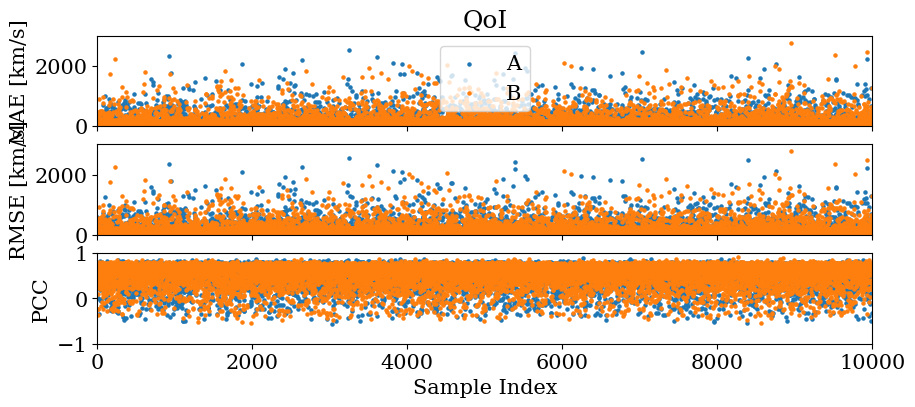

In [17]:
fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(10, 4))
ax[0].scatter(np.arange(N_curr), YA_MAE,  s=5, label="A")
ax[0].scatter(np.arange(N_curr), YB_MAE, s=5, label="B")
ax[0].set_ylabel("MAE [km/s]")
ax[0].set_xlim(0, N_curr)
ax[0].set_ylim(0, 3000)
ax[0].legend()


ax[1].scatter(np.arange(N_curr), YA_RMSE,  s=5, label="A")
ax[1].scatter(np.arange(N_curr), YB_RMSE, s=5, label="B")
ax[1].set_ylabel("RMSE [km/s]")
ax[1].set_xlim(0, N_curr)
ax[1].set_ylim(0, 3000)


ax[2].scatter(np.arange(N_curr), YA_PCC,  s=5, label="A")
ax[2].scatter(np.arange(N_curr), YB_PCC, s=5, label="B")
ax[2].set_ylabel("PCC")
ax[2].set_xlim(0, N_curr)
ax[2].set_ylim(-1, 1)


_ = ax[0].set_title("QoI")
_ = ax[2].set_xlabel("Sample Index")

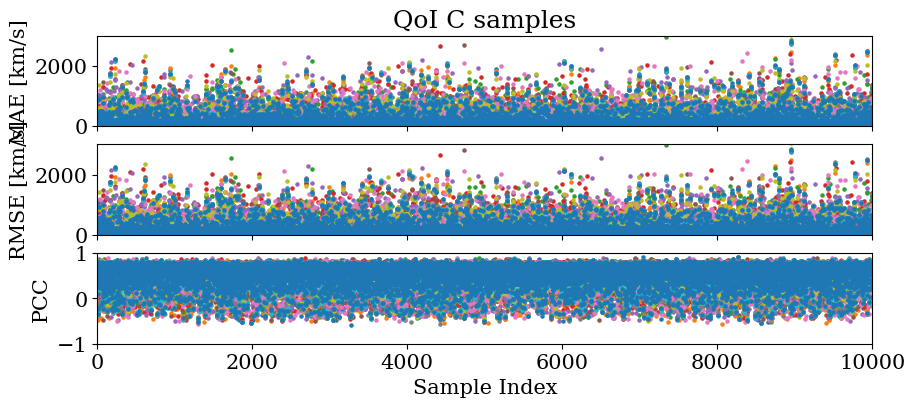

In [18]:
fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(10, 4))
for jj in range(11):
    ax[0].scatter(np.arange(N_curr), YC_MAE[:, jj],  s=5)
    ax[1].scatter(np.arange(N_curr), YC_RMSE[:, jj],  s=5)
    ax[2].scatter(np.arange(N_curr), YC_PCC[:, jj],  s=5)
ax[0].set_ylabel("MAE [km/s]")
ax[0].set_xlim(0, N_curr)
ax[0].set_ylim(0, 3000)

ax[1].set_ylabel("RMSE [km/s]")
ax[1].set_ylim(0, 3000)

ax[2].set_ylabel("PCC")
ax[2].set_ylim(-1, 1)



_ = ax[0].set_title("QoI C samples")
_ = ax[2].set_xlabel("Sample Index")

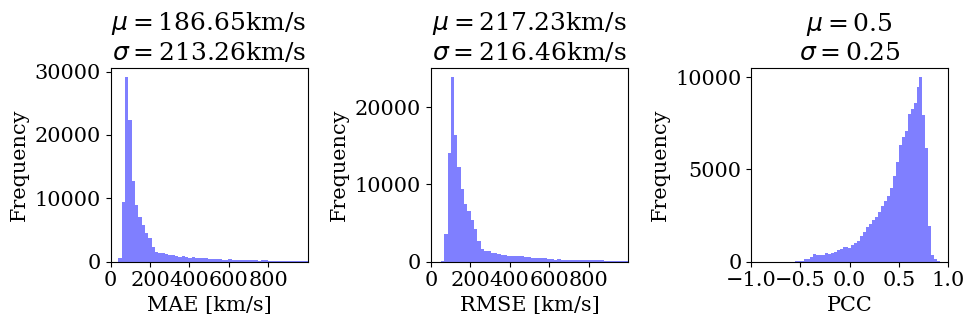

In [19]:
fig, ax = plt.subplots(ncols=3, figsize=(10, 3.5))

mu_mae = np.mean(np.r_[YA_MAE, YB_MAE, YC_MAE.flatten()])
sigma_mae = np.std(np.r_[YA_MAE, YB_MAE, YC_MAE.flatten()])

n , bins, _ = ax[0].hist(np.r_[YA_MAE, YB_MAE, YC_MAE.flatten()], 200, alpha=0.5, color="blue")
_ = ax[0].set_xticks(np.arange(0, 1000, 200))
_ = ax[0].set_xlim(0, 1000)
_ = ax[0].set_ylabel("Frequency")
_ = ax[0].set_xlabel("MAE [km/s]")
_ = ax[0].set_title("$\mu = $"+ str(round(mu_mae, 2)) + "km/s \n" + "$\sigma = $" + str(round(sigma_mae, 2)) + "km/s")
_ = ax[0].set_ylabel("Frequency") 

mu_rmse = np.mean(np.r_[YA_RMSE, YB_RMSE, YC_RMSE.flatten()])
sigma_rmse = np.std(np.r_[YA_RMSE, YB_RMSE, YC_RMSE.flatten()])
n , bins, _ = ax[1].hist(np.r_[YA_RMSE, YB_RMSE, YC_RMSE.flatten()], 200, alpha=0.5, color="blue")
_ = ax[1].set_xticks(np.arange(0, 1000, 200))
_ = ax[1].set_title("$\mu = $"+ str(round(mu_rmse, 2)) + "km/s \n" + "$\sigma = $" + str(round(sigma_rmse, 2)) + "km/s")
_ = ax[1].set_xlim(0, 1000)
_ = ax[1].set_ylabel("Frequency")
_ = ax[1].set_xlabel("RMSE [km/s]")
_ = ax[1].set_ylabel("Frequency") 


mu_pcc = np.mean(np.r_[YA_PCC, YB_PCC, YC_PCC.flatten()])
sigma_pcc = np.std(np.r_[YA_PCC, YB_PCC, YC_PCC.flatten()])
n , bins, _ = ax[2].hist(np.r_[YA_PCC, YB_PCC, YC_PCC.flatten()], 50, alpha=0.5, color="blue")
_ = ax[2].set_xticks(np.linspace(-1, 1, 5))
_ = ax[2].set_title("$\mu = $"+ str(round(mu_pcc, 2)) + "\n" + "$\sigma = $" + str(round(sigma_pcc, 2)))
_ = ax[2].set_ylabel("Frequency")
_ = ax[2].set_xlabel("PCC")

plt.tight_layout()

# Samples

In [20]:
# get samples
# get samples
A = np.load(dir_name + "/samples/A_sample_scaled_20000.npy")[:N_curr, :]
B = np.load(dir_name + "/samples/B_sample_scaled_20000.npy")[:N_curr, :]
C = np.load(dir_name + "/samples/C_sample_scaled_20000.npy")[:, :N_curr, :]
np.shape(C)

(11, 10000, 11)

# Optimal Parameter Combination

In [21]:
# MAE
print(np.min(YA_MAE))
print(np.min(YB_MAE))
print(np.min(YC_MAE))
index = np.unravel_index(YC_MAE.argmin(), YC_MAE.shape)
np.save(file=dir_name + "/MAP/MAE", arr=C[index[1], index[0]])

48.76367065029799
47.084947018770215
39.611836929583326


In [22]:
# RMSE
print(np.min(YA_RMSE))
print(np.min(YB_RMSE))
print(np.min(YC_RMSE))
index = np.unravel_index(YC_RMSE.argmin(), YC_RMSE.shape)
np.save(file=dir_name + "/MAP/RMSE", arr=C[index[1], index[0]])

64.47611371200294
63.08248053720586
50.94257117516246


In [23]:
# PCC
print(np.max(YA_PCC))
print(np.max(YB_PCC))
print(np.max(YC_PCC))
index = np.unravel_index(YC_PCC.argmax(), YC_PCC.shape)
np.save(file=dir_name + "/MAP/PCC", arr=C[index[1], index[0]])

0.8821317987341488
0.9105804756225253
0.9168822061144781


# Compute Indices

In [24]:
main_effect_MAE, total_effect_MAE = np.zeros((5, 11)), np.zeros((5, 11))
main_effect_RMSE, total_effect_RMSE = np.zeros((5, 11)), np.zeros((5, 11))
main_effect_PCC, total_effect_PCC = np.zeros((5, 11)), np.zeros((5, 11))

estimator = ["sobol", "jansen", "saltelli", "janon", "gamboa"]

for jj in range(len(estimator)):
    main_effect_MAE[jj, :], total_effect_MAE[jj, :] = estimate_sobol(YA_MAE, YB_MAE, YC_MAE, A, estimator[jj])
    main_effect_RMSE[jj, :], total_effect_RMSE[jj, :] = estimate_sobol(YA_RMSE, YB_RMSE, YC_RMSE, A,  estimator[jj])
    main_effect_PCC[jj, :], total_effect_PCC[jj, :] = estimate_sobol(YA_PCC, YB_PCC, YC_PCC, A, estimator[jj])

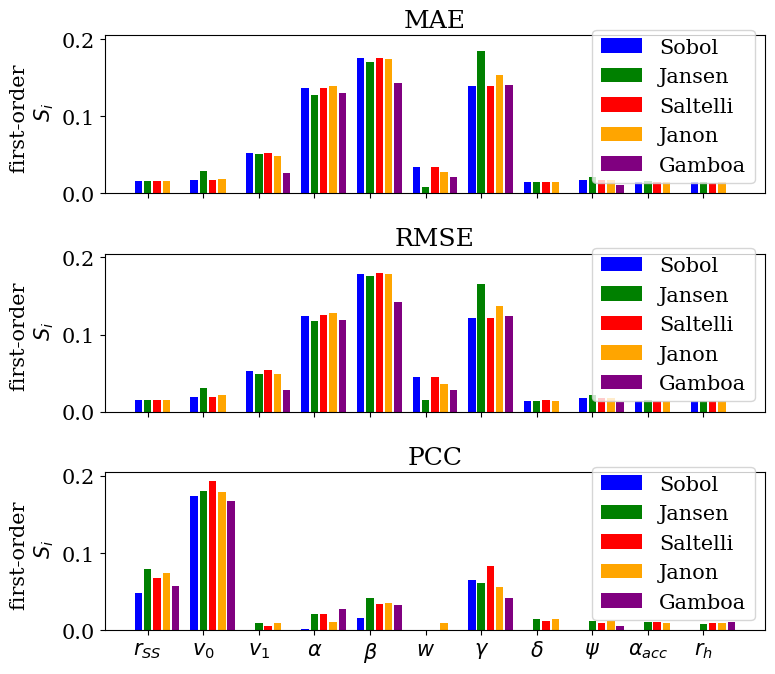

In [25]:
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True, figsize=(8, 7))

d = 11 # number of parameters

jj = 0
for ii in range(d):
    for kk in range(5):
        if kk==0:
            color="b"
            label="Sobol"
        elif kk==1:
            color="g"
            label="Jansen"
        elif kk==2:
            color="r"
            label="Saltelli"
        elif kk==3:
            color="orange"
            label="Janon"
        elif kk==4:
            color="purple"
            label="Gamboa"
            
        if ii==0:
            _ = ax[2].bar(np.arange(jj, jj+1), main_effect_PCC[kk, ii], color=color, label=label)
            _ = ax[1].bar(np.arange(jj, jj+1), main_effect_RMSE[kk, ii], color=color, label=label)
            _ = ax[0].bar(np.arange(jj, jj+1), main_effect_MAE[kk, ii], color=color, label=label)
        else:
            _ = ax[2].bar(np.arange(jj, jj+1), main_effect_PCC[kk, ii], color=color)
            _ = ax[1].bar(np.arange(jj, jj+1), main_effect_RMSE[kk, ii], color=color)
            _ = ax[0].bar(np.arange(jj, jj+1), main_effect_MAE[kk, ii], color=color)
        jj+=1
    jj+=1
    

_ = ax[0].legend()
_ = ax[1].legend()
_ = ax[2].legend()
_ = ax[1].set_xticks(range(1, d*6, 6))
_ = ax[0].set_title("MAE")
_ = ax[1].set_xticks(range(1, d*6, 6))
_ = ax[1].set_title("RMSE")
_ = ax[2].set_xticks(range(1, d*6, 6))
_ = ax[2].set_title("PCC")
_ = ax[0].set_xticklabels([r"$r_{SS}$", r"$v_{0}$", r"$v_{1}$", r"$\alpha$", r"$\beta$", r"$w$", r"$\gamma$", r"$\delta$", r"$\psi$", r"$ \alpha_{acc}$", r"$r_{h}$"])
_ = ax[0].set_ylim(bottom=0)
_ = ax[0].set_ylabel("first-order \n $S_{i}$")
_ = ax[1].set_ylabel("first-order \n $S_{i}$")
_ = ax[2].set_ylabel("first-order \n $S_{i}$")
plt.tight_layout()

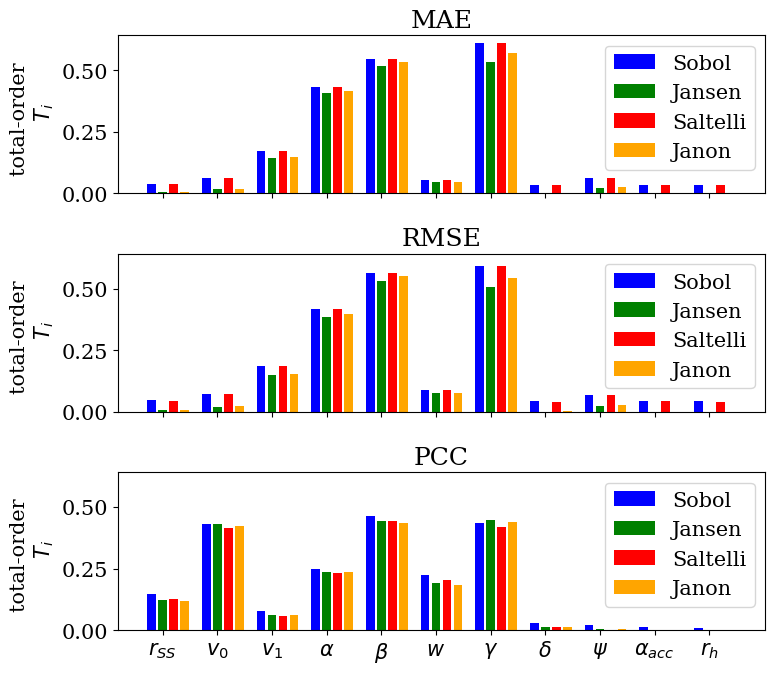

In [26]:
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True, figsize=(8, 7))

jj=0
for ii in range(d):
    for kk in range(4):
        if kk==0:
            color="b"
            label="Sobol"
        elif kk==1:
            color="g"
            label="Jansen"
        elif kk==2:
            color="r"
            label="Saltelli"
        elif kk==3:
            color="orange"
            label="Janon"
        if ii==0:
            _ = ax[2].bar(np.arange(jj, jj+1), total_effect_PCC[kk, ii], color=color, label=label)
            _ = ax[1].bar(np.arange(jj, jj+1), total_effect_RMSE[kk, ii], color=color, label=label)
            _ = ax[0].bar(np.arange(jj, jj+1), total_effect_MAE[kk, ii], color=color, label=label)
        else:
            _ = ax[2].bar(np.arange(jj, jj+1), total_effect_PCC[kk, ii], color=color)
            _ = ax[1].bar(np.arange(jj, jj+1), total_effect_RMSE[kk, ii], color=color)
            _ = ax[0].bar(np.arange(jj, jj+1), total_effect_MAE[kk, ii], color=color)
        jj+=1
    jj+=1
    

_ = ax[0].legend()
_ = ax[1].legend()
_ = ax[2].legend()
_ = ax[1].set_xticks(range(1, d*5, 5))
_ = ax[0].set_title("MAE")
_ = ax[1].set_xticks(range(1, d*5, 5))
_ = ax[1].set_title("RMSE")
_ = ax[2].set_xticks(range(1, d*5, 5))
_ = ax[2].set_title("PCC")
_ = ax[0].set_xticklabels([r"$r_{SS}$", r"$v_{0}$", r"$v_{1}$", r"$\alpha$", r"$\beta$", r"$w$", r"$\gamma$", r"$\delta$", r"$\psi$", r"$ \alpha_{acc}$", r"$r_{h}$"])
_ = ax[0].set_ylabel("total-order \n $T_{i}$")
_ = ax[1].set_ylabel("total-order \n $T_{i}$")
_ = ax[2].set_ylabel("total-order \n $T_{i}$")
_ = ax[0].set_ylim(bottom=0)
plt.tight_layout()

# Bootstrapping

Bootstrap (or resampling) techniques are a collection of computationally intensive methods that are based on resampling from the observed data. Bootstraping is typically used to compute an estimator's variance and  mean.

In [27]:
n_bootstrap = 100
n_boot_sample = 3000

main_effect_MAE_boot, total_effect_MAE_boot = np.zeros((n_bootstrap, len(estimator), d)), np.zeros((n_bootstrap, len(estimator), d))
main_effect_RMSE_boot, total_effect_RMSE_boot = np.zeros((n_bootstrap, len(estimator), d)), np.zeros((n_bootstrap, len(estimator), d))
main_effect_PCC_boot, total_effect_PCC_boot = np.zeros((n_bootstrap, len(estimator), d)), np.zeros((n_bootstrap, len(estimator), d))

for ii in range(n_bootstrap):
    indexes = np.random.randint(0, N_curr, n_boot_sample)
    YA_MAE_boot = YA_MAE[indexes]
    YB_MAE_boot = YB_MAE[indexes]
    YC_MAE_boot = YC_MAE[indexes, :]
    
    YA_RMSE_boot = YA_RMSE[indexes]
    YB_RMSE_boot = YB_RMSE[indexes]
    YC_RMSE_boot = YC_RMSE[indexes, :]
    
    YA_PCC_boot = YA_PCC[indexes]
    YB_PCC_boot = YB_PCC[indexes]
    YC_PCC_boot = YC_PCC[indexes, :]
    
    A_boot = A[indexes, :]
    
    for jj in range(len(estimator)):
        main_effect_MAE_boot[ii, jj, :], total_effect_MAE_boot[ii, jj, :] = estimate_sobol(YA=YA_MAE_boot, 
                                                                                 YB=YB_MAE_boot, 
                                                                                 YC=YC_MAE_boot, 
                                                                                 A=A_boot, 
                                                                                 type_estimator=estimator[jj])
        main_effect_RMSE_boot[ii, jj, :], total_effect_RMSE_boot[ii, jj, :] = estimate_sobol(YA=YA_RMSE_boot, 
                                                                                   YB=YB_RMSE_boot, 
                                                                                   YC=YC_RMSE_boot, 
                                                                                   A=A_boot, 
                                                                                   type_estimator=estimator[jj])
        main_effect_PCC_boot[ii, jj, :], total_effect_PCC_boot[ii, jj, :] = estimate_sobol(YA=YA_PCC_boot, 
                                                                                 YB=YB_PCC_boot, 
                                                                                 YC=YC_PCC_boot, 
                                                                                 A=A_boot, 
                                                                                 type_estimator=estimator[jj])

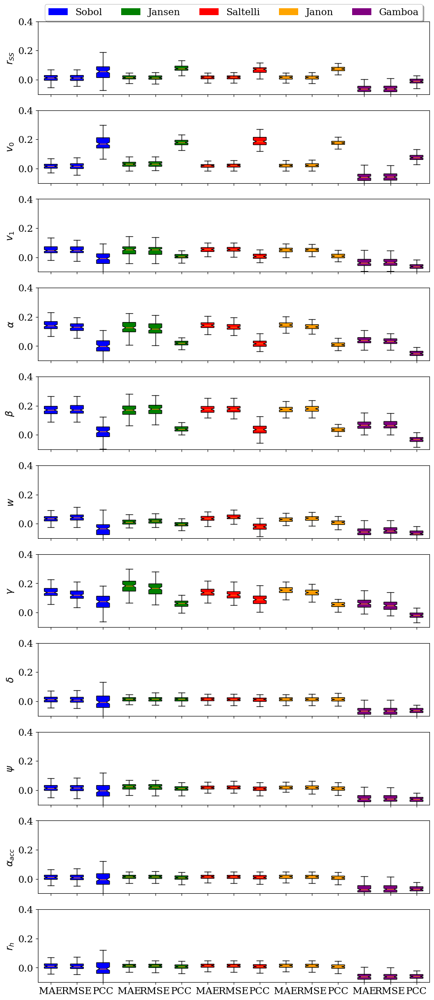

In [28]:
fig, ax = plt.subplots(nrows=d, sharex=True,  figsize=(10, 22))
labels = [r"$r_{SS}$", r"$v_{0}$", r"$v_{1}$", r"$\alpha$", r"$\beta$", r"$w$", r"$\gamma$", r"$\delta$", r"$\psi$", r"$ \alpha_{acc}$", r"$r_{h}$"]
for ii in range(d):
    bplot = ax[ii].boxplot([main_effect_MAE_boot[:,0,ii], 
                            main_effect_RMSE_boot[:,0,ii],
                            main_effect_PCC_boot[:,0,ii],
                            main_effect_MAE_boot[:,1,ii],
                            main_effect_RMSE_boot[:,1,ii],
                            main_effect_PCC_boot[:,1,ii],
                            main_effect_MAE_boot[:,2,ii], 
                            main_effect_RMSE_boot[:,2,ii],
                            main_effect_PCC_boot[:,2,ii],
                            main_effect_MAE_boot[:,3,ii], 
                            main_effect_RMSE_boot[:,3,ii],
                            main_effect_PCC_boot[:,3,ii],
                            main_effect_MAE_boot[:,-1,ii] -0.2, 
                            main_effect_RMSE_boot[:,-1,ii] - 0.2,
                            main_effect_PCC_boot[:,-1,ii] - 0.2],
                      notch=True, patch_artist=True, showfliers=False)

    # fill with colors
    colors = ['blue', "blue", "blue", 
              "green", "green", "green", 
              "red", "red", "red",
              "orange", "orange", "orange", 
              "purple", "purple", "purple"]
    
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)
        
    ax[ii].set_xticks(np.arange(3*5)+1)
    ax[ii].set_xticklabels(["MAE",
                            "RMSE", 
                            "PCC", 
                            "MAE",
                            "RMSE", 
                            "PCC", 
                            "MAE",
                            "RMSE", 
                            "PCC", 
                            "MAE",
                            "RMSE", 
                            "PCC", 
                            "MAE",
                            "RMSE", 
                            "PCC"])
    ax[ii].set_ylabel(labels[ii])
    ax[ii].set_ylim(-0.1, 0.4)

    for kk in range(5):
        if kk==0:
            color="b"
            label="Sobol"
        elif kk==1:
            color="g"
            label="Jansen"
        elif kk==2:
            color="r"
            label="Saltelli"
        elif kk==3:
            color="orange"
            label="Janon"
        elif kk==4:
            color="purple"
            label="Gamboa"
        if ii == 0 :
            _ = ax[ii].bar(np.arange(1, 1.3), 0, color=color, label=label)
            ax[ii].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), ncol=5, fancybox=True, shadow=True)
    
plt.tight_layout()

# Ordered Indices

In [29]:
color=np.array(mcp.gen_color(cmap="tab20c", n=11))
parameters_label = np.array(["$r_{SS}$", r"$v_{0}$", r"$v_{1}$", r"$\alpha$", r"$\beta$", r"$w$", r"$\gamma$", r"$\delta$", r"$\psi$", r"$ \alpha_{acc}$", r"$r_{h}$"])

In [30]:
main_effect_MAE, total_effect_MAE = np.zeros((5, 11)), np.zeros((5, 11))
main_effect_RMSE, total_effect_RMSE = np.zeros((5, 11)), np.zeros((5, 11))
main_effect_PCC, total_effect_PCC = np.zeros((5, 11)), np.zeros((5, 11))

estimator = ["sobol", "jansen", "saltelli", "janon", "gamboa"]

for jj in range(len(estimator)):
    main_effect_MAE[jj, :], total_effect_MAE[jj, :] = estimate_sobol(YA_MAE, YB_MAE, YC_MAE, A, estimator[jj])
    main_effect_RMSE[jj, :], total_effect_RMSE[jj, :] = estimate_sobol(YA_RMSE, YB_RMSE, YC_RMSE, A,  estimator[jj])
    main_effect_PCC[jj, :], total_effect_PCC[jj, :] = estimate_sobol(YA_PCC, YB_PCC, YC_PCC, A, estimator[jj])

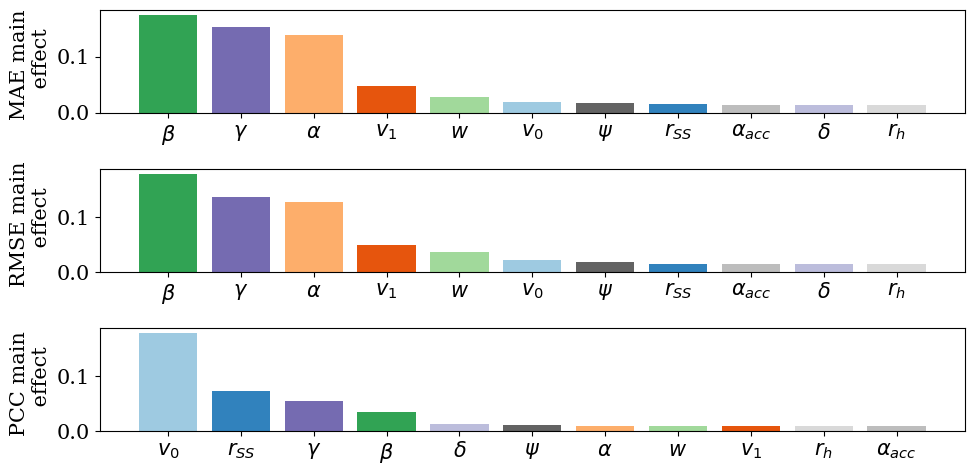

In [31]:
fig, ax = plt.subplots(nrows=3, figsize=(10, 5))
_ = ax[0].bar(np.arange(d), np.sort(main_effect_MAE[3, :])[::-1], color=color[np.argsort(main_effect_MAE[3, :])[::-1]])
_ = ax[0].set_xticks(np.arange(d))
_ = ax[0].set_xticklabels(parameters_label[np.argsort(main_effect_MAE[3, :])[::-1]])
_ = ax[0].set_ylabel("MAE main \n effect")

_ = ax[1].bar(np.arange(d), np.sort(main_effect_RMSE[3, :])[::-1], color=color[np.argsort(main_effect_RMSE[3, :])[::-1]])
_ = ax[1].set_xticks(np.arange(d))
_ = ax[1].set_xticklabels(parameters_label[np.argsort(main_effect_RMSE[3, :])[::-1]])
_ = ax[1].set_ylabel("RMSE main \n effect")

_ = ax[2].bar(np.arange(d), np.sort(main_effect_PCC[3, :])[::-1], color=color[np.argsort(main_effect_PCC[3, :])[::-1]])
_ = ax[2].set_xticks(np.arange(d))
_ = ax[2].set_xticklabels(parameters_label[np.argsort(main_effect_PCC[3, :])[::-1]])
_ = ax[2].set_ylabel("PCC main \n effect")
plt.tight_layout()

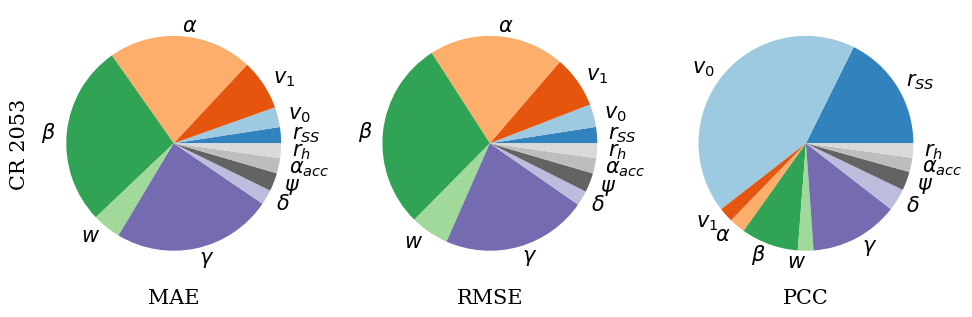

In [32]:
fig, ax = plt.subplots(ncols=3, figsize=(10, 4))
_ = ax[0].pie(main_effect_MAE[3, :], labels=parameters_label, colors=np.array(mcp.gen_color(cmap="tab20c", n=11)))
_ = ax[1].pie(main_effect_RMSE[3, :], labels=parameters_label, colors=np.array(mcp.gen_color(cmap="tab20c", n=11)))
_ = ax[2].pie(main_effect_PCC[3, :], labels=parameters_label, colors=np.array(mcp.gen_color(cmap="tab20c", n=11)))
_ = ax[0].set_xlabel("MAE")
_ = ax[1].set_xlabel("RMSE")
_ = ax[2].set_xlabel("PCC")
_ = ax[0].set_ylabel("CR 2053")
plt.tight_layout()
plt.savefig("../figs/CR2053/main_effect_indices.png", dpi=500)

In [33]:
main_effect_PCC[3, 1]/np.sum(main_effect_PCC[3, :])

0.42842043626428294

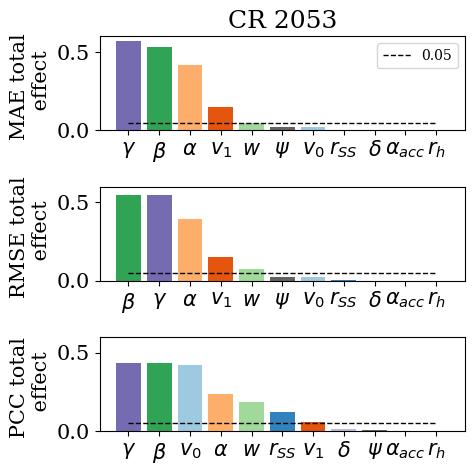

In [34]:
fig, ax = plt.subplots(nrows=3, sharey=True, figsize=(5, 5))
_ = ax[0].set_ylim(0, 0.6)
_ = ax[0].set_title("CR 2053")
_ = ax[0].bar(np.arange(d), np.sort(total_effect_MAE[3, :])[::-1], color=color[np.argsort(total_effect_MAE[3, :])[::-1]])
_ = ax[0].set_xticks(np.arange(d))
_ = ax[0].set_xticklabels(parameters_label[np.argsort(total_effect_MAE[3, :])[::-1]])
_ = ax[0].set_ylabel("MAE total \n effect")

_ = ax[1].bar(np.arange(d), np.sort(total_effect_RMSE[3, :])[::-1], color=color[np.argsort(total_effect_RMSE[3, :])[::-1]])
_ = ax[1].set_xticks(np.arange(d))
_ = ax[1].set_xticklabels(parameters_label[np.argsort(total_effect_RMSE[3, :])[::-1]])
_ = ax[1].set_ylabel("RMSE total \n effect")

_ = ax[2].bar(np.arange(d), np.sort(total_effect_PCC[3, :])[::-1], color=color[np.argsort(total_effect_PCC[3, :])[::-1]])
_ = ax[2].set_xticks(np.arange(d))
_ = ax[2].set_xticklabels(parameters_label[np.argsort(total_effect_PCC[3, :])[::-1]])
_ = ax[2].set_ylabel("PCC total \n effect")

_ = ax[0].hlines(0.05, xmin=0, xmax=10, color="black", ls="--", linewidth=1, label="0.05")
_ = ax[1].hlines(0.05, xmin=0, xmax=10, color="black", ls="--", linewidth=1)
_ = ax[2].hlines(0.05, xmin=0, xmax=10, color="black", ls="--", linewidth=1)
_ = ax[0].legend(fontsize=10)

plt.tight_layout()
plt.savefig("../figs/GSA/total_indices_CR"+ str(CR) + ".png", dpi=600)

In [35]:
np.argsort(total_effect_RMSE[3, :])[::-1]

array([ 4,  6,  3,  2,  5,  8,  1,  0,  7,  9, 10])

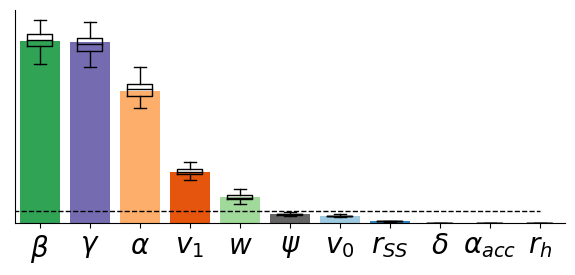

In [38]:
fig, ax = plt.subplots(figsize=(6, 3))

_ = ax.bar(np.arange(d)+1, 100*np.sort(total_effect_RMSE[3, :])[::-1]/np.sum(total_effect_RMSE[3, :]), color=color[np.argsort(total_effect_RMSE[3, :])[::-1]])

box_plot = ax.boxplot([100*total_effect_RMSE_boot[:, 3 , 4]/np.sum(total_effect_RMSE[3, :]), 
            100*total_effect_RMSE_boot[:, 3 , 6]/np.sum(total_effect_RMSE[3, :]), 
            100*total_effect_RMSE_boot[:, 3 , 3]/np.sum(total_effect_RMSE[3, :]), 
            100*total_effect_RMSE_boot[:, 3 , 2]/np.sum(total_effect_RMSE[3, :]), 
            100*total_effect_RMSE_boot[:, 3 , 5]/np.sum(total_effect_RMSE[3, :]),
            100*total_effect_RMSE_boot[:, 3 , 8]/np.sum(total_effect_RMSE[3, :]),
            100*total_effect_RMSE_boot[:, 3 , 1]/np.sum(total_effect_RMSE[3, :]),
            100*total_effect_RMSE_boot[:, 3 , 0]/np.sum(total_effect_RMSE[3, :]),
            100*total_effect_RMSE_boot[:, 3 , 7]/np.sum(total_effect_RMSE[3, :]),
            100*total_effect_RMSE_boot[:, 3 , 9]/np.sum(total_effect_RMSE[3, :]), 
            100*total_effect_RMSE_boot[:, 3 , 10]/np.sum(total_effect_RMSE[3, :])], 
           notch=False, 
           patch_artist=False, 
           showfliers=False, 
           showmeans=False
)
for median in box_plot['medians']:
    median.set_color('black')

_ = ax.set_xticks(np.arange(d)+1)
_ = ax.set_xticklabels(parameters_label[np.argsort(total_effect_RMSE[3, :])[::-1]], fontsize=20)

# _ = ax.set_ylabel("RMSE \n total indicies %", fontsize=19)
_ = ax.set_yticks([], fontsize=19)
_ = ax.hlines(2, xmin=0, xmax=11, color="black", ls="--", linewidth=1, label="2 %")
#_ = ax.legend(fontsize=15)
ax.set_xlim(0.5, 11.5)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.savefig("../figs/GSA/RMSE_total_indices_CR"+ str(CR) + ".png", dpi=600)

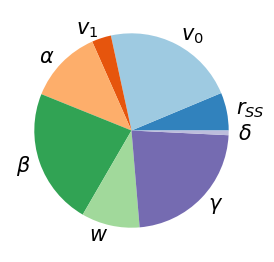

In [33]:
fig, ax = plt.subplots(figsize=(3, 3))
_ = ax.pie(total_effect_PCC[3, :][:-3], labels=parameters_label[:-3], colors=np.array(mcp.gen_color(cmap="tab20c", n=11)))
plt.tight_layout()
plt.savefig("../figs/GSA/PCC_total_indices_CR"+ str(CR) + ".png", dpi=600)

In [34]:
print(r"PCC $r_{ss}$ contribution", 100*total_effect_PCC[3, :][:-3][0]/np.sum(total_effect_PCC[3, :]))
print(r"PCC $v_{0}$ contribution", 100*total_effect_PCC[3, :][:-3][1]/np.sum(total_effect_PCC[3, :]))

print(r"PCC $\psi$ contribution", 100*total_effect_PCC[3, :][-3]/np.sum(total_effect_PCC))
print(r"PCC $r_{h}$ contribution", 100*total_effect_PCC[3, :][-2]/np.sum(total_effect_PCC))
print(r"PCC $r_{h}$ contribution", 100*total_effect_PCC[3, :][-1]/np.sum(total_effect_PCC))

PCC $r_{ss}$ contribution 6.272177613089045
PCC $v_{0}$ contribution 22.01127630652008
PCC $\psi$ contribution 0.08393926794256032
PCC $r_{h}$ contribution 0.018045131229534283
PCC $r_{h}$ contribution 0.0025183449028155706


# Test Convergence  "Law of Large Numbers"

In [31]:
estimator

['sobol', 'jansen', 'saltelli', 'janon', 'gamboa']

In [32]:
test_points = np.arange(int(1e3), N_curr, 50)
main_results = np.zeros((d, len(test_points), len(estimator), 3))
total_results = np.zeros((d, len(test_points), len(estimator), 3))

for kk in range(len(estimator)): 
    jj=0
    for ii in test_points: 
        main_results[:, jj, kk, 0], total_results[:, jj, kk, 0] = estimate_sobol(YA=YA_MAE[:ii], 
                                                                                 YB=YB_MAE[:ii], 
                                                                                 YC=YC_MAE[:ii, :], 
                                                                                 A=A[:ii, :],
                                                                                 type_estimator=estimator[kk])
        main_results[:, jj, kk, 1], total_results[:, jj, kk, 1] = estimate_sobol(YA=YA_RMSE[:ii], 
                                                                                 YB=YB_RMSE[:ii], 
                                                                                 YC=YC_RMSE[:ii, :], 
                                                                                 A=A[:ii, :],
                                                                                 type_estimator=estimator[kk])
        main_results[:, jj, kk, 2], total_results[:, jj, kk, 2] = estimate_sobol(YA=YA_PCC[:ii], 
                                                                                 YB=YB_PCC[:ii], 
                                                                                 YC=YC_PCC[:ii, :], 
                                                                                 A=A[:ii, :],
                                                                                 type_estimator=estimator[kk])
        jj+=1

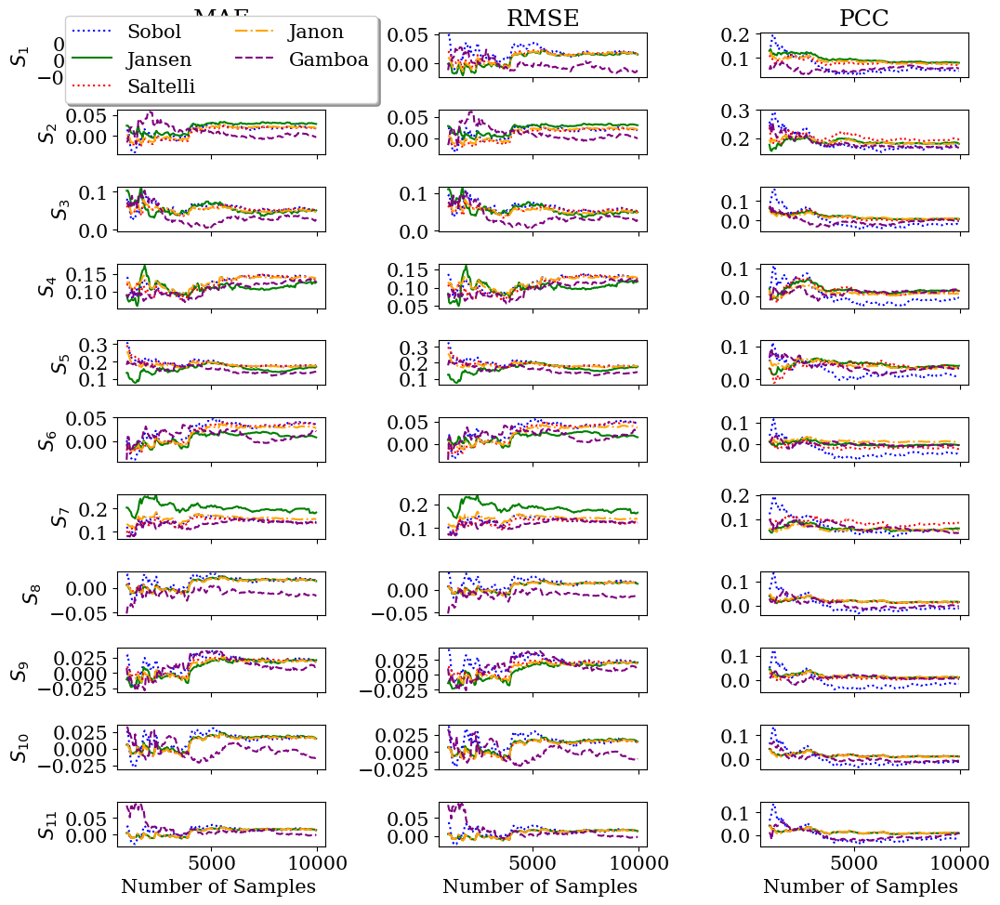

In [33]:
fig, ax = plt.subplots(ncols=3, nrows=11, sharex=True, figsize=(11, 10))


for ii in range(d):
    for kk in range(len(estimator)):
        if kk==0:
            color="b"
            label="Sobol"
            ls=":"
        elif kk==1:
            color="g"
            label="Jansen"
            ls="-"
        elif kk==2:
            color="r"
            label="Saltelli"
            ls=":"
        elif kk==3:
            color="orange"
            label="Janon"
            ls="-."
        elif kk==4:
            color="purple"
            label="Gamboa"
            ls="--"
        ax[ii, 0].plot(test_points, main_results[ii, :, kk, 0], color=color, ls=ls, label=label)
        ax[ii, 1].plot(test_points, main_results[ii, :, kk, 1], color=color, ls=ls, label=label)
        ax[ii, 2].plot(test_points, main_results[ii, :, kk, 2], color=color, ls=ls, label=label)
        ax[ii, 0].set_ylabel("$S_{"+ str(ii+1) + "}$")

ax[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, 1.6), ncol=2, fancybox=True, shadow=True)
        

_ = ax[-1, 0].set_xlabel("Number of Samples ")
_ = ax[-1, 1].set_xlabel("Number of Samples ")
_ = ax[-1, 2].set_xlabel("Number of Samples ")

_ = ax[0, 0].set_title("MAE")
_ = ax[0, 1].set_title("RMSE")
_ = ax[0, 2].set_title("PCC")

plt.tight_layout()

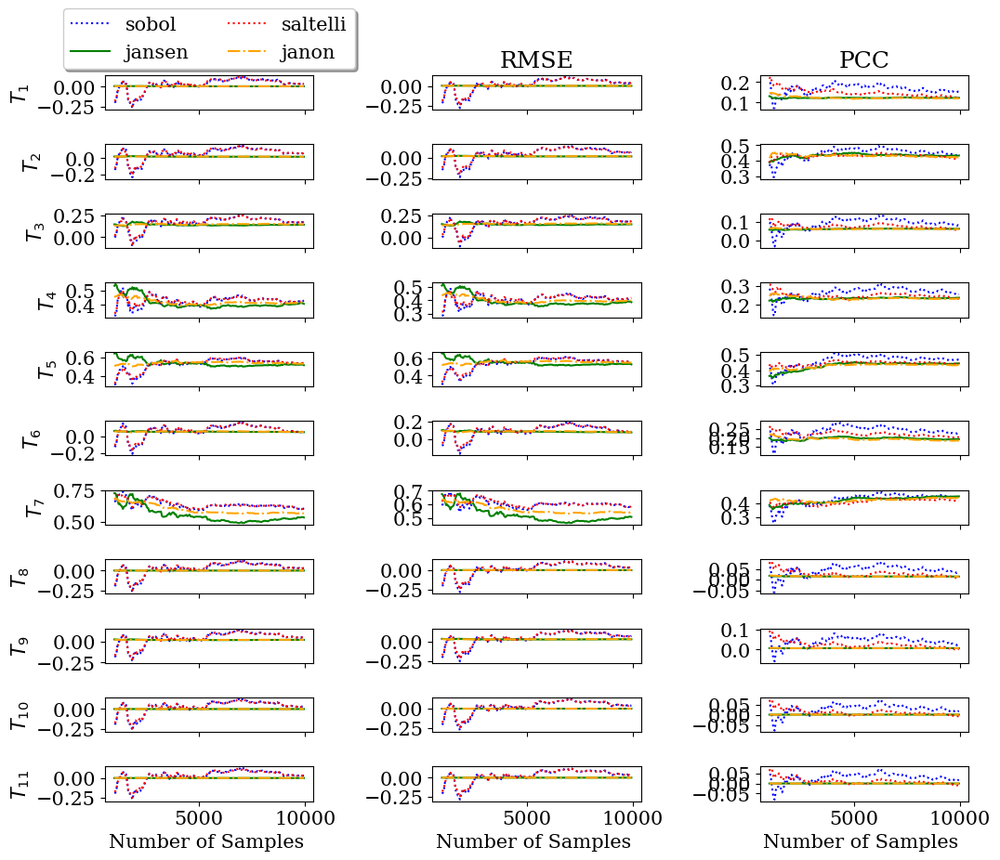

In [34]:
fig, ax = plt.subplots(ncols=3, nrows=11, sharex=True, figsize=(11, 10))

for ii in range(d):
    for kk in range(len(estimator)):
        if kk==0:
            color="b"
            label="Sobol"
            ls=":"
        elif kk==1:
            color="g"
            label="Jansen"
            ls="-"
        elif kk==2:
            color="r"
            label="Saltelli"
            ls=":"
        elif kk==3:
            color="orange"
            label="Janon"
            ls="-."
        elif kk==4:
            color="purple"
            label="Gamboa"
            ls="--"
        if estimator[kk]!="gamboa":
            ax[ii, 0].plot(test_points, total_results[ii, :,kk, 0], color=color, ls=ls, label=estimator[kk])
            ax[ii, 1].plot(test_points, total_results[ii, :,kk, 1], color=color, ls=ls, label=estimator[kk])
            ax[ii, 2].plot(test_points, total_results[ii, :,kk, 2], color=color, ls=ls, label=estimator[kk])
            ax[ii, 0].set_ylabel("$T_{"+ str(ii+1) + "}$")
            
ax[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, 3.2), ncol=2, fancybox=True, shadow=True)

_ = ax[-1, 0].set_xlabel("Number of Samples ")
_ = ax[-1, 1].set_xlabel("Number of Samples ")
_ = ax[-1, 2].set_xlabel("Number of Samples ")
_ = ax[0, 0].set_title("MAE")
_ = ax[0, 1].set_title("RMSE")
_ = ax[0, 2].set_title("PCC")
plt.tight_layout()

# Results in Parameter Space

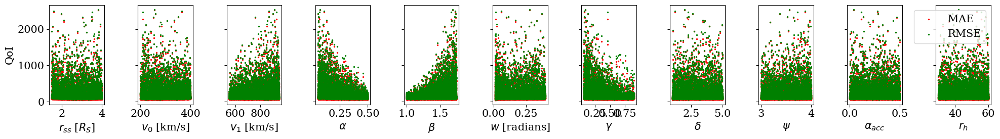

In [35]:
fig, ax = plt.subplots(ncols=11, sharey=True, figsize=(20, 3))
for ii in range(d):
    ax[ii].scatter(A[:, ii], YA_MAE, s=2, c="red", label="MAE")
    ax[ii].scatter(A[:, ii], YA_RMSE, s=2, c="green", label="RMSE")
ax[0].set_ylabel("QoI")
ax[0].set_xlabel(r"$r_{ss}$ [$R_{S}$]")
ax[1].set_xlabel(r"$v_{0}$ [km/s]")
ax[2].set_xlabel(r"$v_{1}$ [km/s]")
ax[3].set_xlabel(r"$\alpha$")
ax[4].set_xlabel(r"$\beta$")
ax[5].set_xlabel(r"$w$ [radians]")
ax[6].set_xlabel(r"$\gamma$")
ax[7].set_xlabel(r"$\delta$")
ax[8].set_xlabel(r"$\psi$")
ax[9].set_xlabel(r"$\alpha_{acc}$")
ax[10].set_xlabel(r"$r_{h}$")
ax[10].legend()
plt.tight_layout()

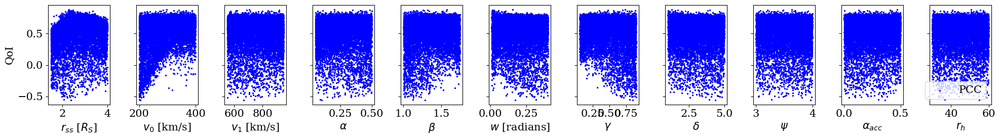

In [36]:
fig, ax = plt.subplots(ncols=11, sharey=True, figsize=(20, 3))
for ii in range(d):
    ax[ii].scatter(A[:, ii], YA_PCC, s=2, c="blue", label="PCC")
ax[0].set_ylabel("QoI")
ax[0].set_xlabel(r"$r_{ss}$ [$R_{S}$]")
ax[1].set_xlabel(r"$v_{0}$ [km/s]")
ax[2].set_xlabel(r"$v_{1}$ [km/s]")
ax[3].set_xlabel(r"$\alpha$")
ax[4].set_xlabel(r"$\beta$")
ax[5].set_xlabel(r"$w$ [radians]")
ax[6].set_xlabel(r"$\gamma$")
ax[7].set_xlabel(r"$\delta$")
ax[8].set_xlabel(r"$\psi$")
ax[9].set_xlabel(r"$\alpha_{acc}$")
ax[10].set_xlabel(r"$r_{h}$")
ax[10].legend()
plt.tight_layout()

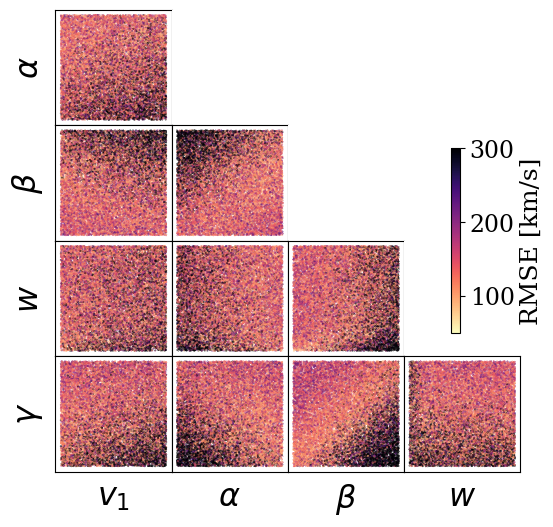

In [102]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(6, 6))

norm = plt.Normalize(50, 300)

for jj in range(2, 6):
    for ii in range(2, 6):
        if jj <= ii:
            x = np.append(A[:, jj], B[:, jj])
            y = np.append(A[:, ii+1], B[:, ii+1])
            color = np.append(np.abs(YA_RMSE), np.abs(YB_RMSE))
            pos = ax[ii-2, jj-2].scatter(x, y, c=color,  cmap='magma_r', s=0.05, norm=norm)
            ax[ii-2, jj-2].set_yticks([])
            ax[ii-2, jj-2].set_xticks([])
        else:
            ax[ii-2, jj-2].set_xticks([])
            ax[ii-2, jj-2].set_yticks([])
            ax[ii-2, jj-2].spines['top'].set_visible(False)
            ax[ii-2, jj-2].spines['right'].set_visible(False)
            ax[ii-2, jj-2].spines['bottom'].set_visible(False)
            ax[ii-2, jj-2].spines['left'].set_visible(False)

ax[-1, 0].set_xlabel(r"$v_{1}$", fontsize=23)
ax[-1, 1].set_xlabel(r"$\alpha$", fontsize=23)
ax[-1, 2].set_xlabel(r"$\beta$", fontsize=23)
ax[-1, 3].set_xlabel(r"$w$", fontsize=23)

ax[0, 0].set_ylabel(r"$\alpha$", fontsize=23)
ax[1, 0].set_ylabel(r"$\beta$", fontsize=23)
ax[2, 0].set_ylabel(r"$w$", fontsize=23)
ax[3, 0].set_ylabel(r"$\gamma$", fontsize=23)


cbar = fig.colorbar(pos, ax=ax.ravel().tolist(), location="right", shrink=0.4)
cbar.set_label('RMSE [km/s]', rotation=90, fontsize=18)
cbar.ax.tick_params(labelsize=17)
fig.subplots_adjust(wspace=0, hspace=0)

plt.savefig("../figs/CR" + str(CR) + "/RMSE_parameter_space.png", dpi=500)

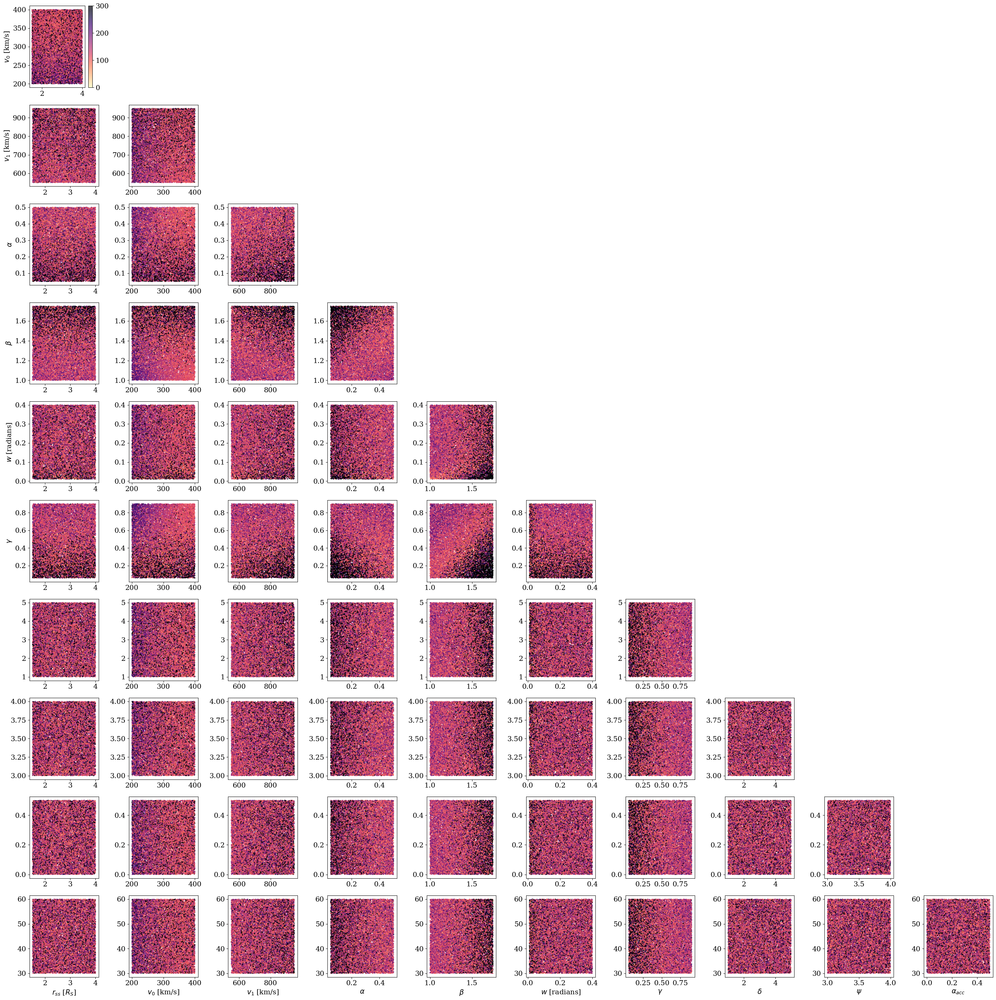

In [38]:
fig, ax = plt.subplots(ncols=d-1, nrows=d-1, figsize=(30, 30))

norm = plt.Normalize(0, 300)

for jj in range(d-1):
    for ii in range(d-1):
        if jj <= ii:
            x = np.append(A[:, jj], B[:, jj])
            y = np.append(A[:, ii+1], B[:, ii+1])
            color = np.append(YA_RMSE, YB_RMSE)
            pos = ax[ii, jj].scatter(x, y, c=color, cmap='magma_r', s=2, alpha=0.7, norm=norm)
            if jj==0 and ii==0:
                fig.colorbar(pos, ax=ax[ii, jj])
        else:
            ax[ii, jj].set_xticks([])
            ax[ii, jj].set_yticks([])
            ax[ii, jj].spines['top'].set_visible(False)
            ax[ii, jj].spines['right'].set_visible(False)
            ax[ii, jj].spines['bottom'].set_visible(False)
            ax[ii, jj].spines['left'].set_visible(False)


ax[-1, 0].set_xlabel(r"$r_{ss}$ [$R_{S}$]")
ax[-1, 1].set_xlabel(r"$v_{0}$ [km/s]")
ax[-1, 2].set_xlabel(r"$v_{1}$ [km/s]")
ax[-1, 3].set_xlabel(r"$\alpha$")
ax[-1, 4].set_xlabel(r"$\beta$")
ax[-1, 5].set_xlabel(r"$w$ [radians]")
ax[-1, 6].set_xlabel(r"$\gamma$")
ax[-1, 7].set_xlabel(r"$\delta$")
ax[-1, 8].set_xlabel(r"$\psi$")
ax[-1, 9].set_xlabel(r"$\alpha_{acc}$")


ax[0, 0].set_ylabel(r"$v_{0}$ [km/s]")
ax[1, 0].set_ylabel(r"$v_{1}$ [km/s]")
ax[2, 0].set_ylabel(r"$\alpha$")
ax[3, 0].set_ylabel(r"$\beta$")
ax[4, 0].set_ylabel(r"$w$ [radians]")
ax[5, 0].set_ylabel(r"$\gamma$")
# ax[6, 0].set_ylabel(r"$\delta$")
# ax[7, 0].set_ylabel(r"$\psi$")
# ax[8, 0].set_ylabel(r"$\alpha_{acc}$")
# ax[9, 0].set_ylabel(r"$r_{h}$")

plt.tight_layout()
plt.savefig("../figs/CR" + str(CR) + "/RMSE_parameter_space.png", dpi=500)

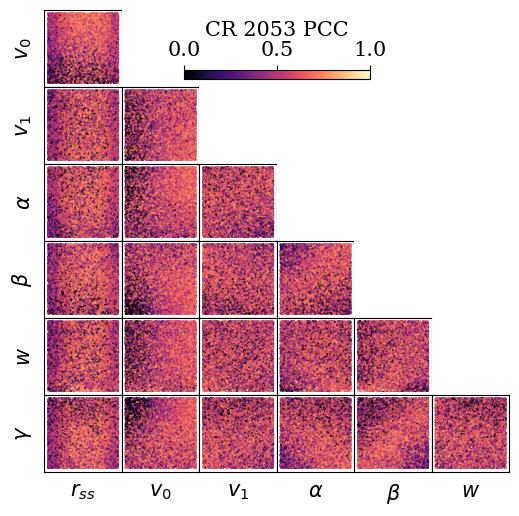

In [39]:
fig, ax = plt.subplots(ncols=6, nrows=6, figsize=(6, 6))

norm = plt.Normalize(0, 1)

for jj in range(6):
    for ii in range(6):
        if jj <= ii:
            x = np.append(A[:, jj], B[:, jj])
            y = np.append(A[:, ii+1], B[:, ii+1])
            color = np.append(YA_PCC, YB_PCC)
            pos = ax[ii, jj].scatter(x, y, c=color,  cmap='magma', s=0.1, norm=norm)
            ax[ii, jj].set_yticks([])
            ax[ii, jj].set_xticks([])
        else:
            ax[ii, jj].set_xticks([])
            ax[ii, jj].set_yticks([])
            ax[ii, jj].spines['top'].set_visible(False)
            ax[ii, jj].spines['right'].set_visible(False)
            ax[ii, jj].spines['bottom'].set_visible(False)
            ax[ii, jj].spines['left'].set_visible(False)

ax[-1, 0].set_xlabel(r"$r_{ss}$")
ax[-1, 1].set_xlabel(r"$v_{0}$")
ax[-1, 2].set_xlabel(r"$v_{1}$")
ax[-1, 3].set_xlabel(r"$\alpha$")
ax[-1, 4].set_xlabel(r"$\beta$")
ax[-1, 5].set_xlabel(r"$w$")
# ax[-1, 6].set_xlabel(r"$\gamma$")
# ax[-1, 7].set_xlabel(r"$\delta$")
# ax[-1, 8].set_xlabel(r"$\psi$")
# ax[-1, 9].set_xlabel(r"$\alpha_{acc}$")

ax[0, 0].set_ylabel(r"$v_{0}$")
ax[1, 0].set_ylabel(r"$v_{1}$")
ax[2, 0].set_ylabel(r"$\alpha$")
ax[3, 0].set_ylabel(r"$\beta$")
ax[4, 0].set_ylabel(r"$w$")
ax[5, 0].set_ylabel(r"$\gamma$")
# ax[6, 0].set_ylabel(r"$\delta$")
# ax[7, 0].set_ylabel(r"$\psi$")
# ax[8, 0].set_ylabel(r"$\alpha_{acc}$")
# ax[9, 0].set_ylabel(r"$r_{h}$")

cbar = fig.colorbar(pos, ax=ax.ravel().tolist(), location="top", shrink=0.4)
cbar.set_label('CR 2053 PCC', rotation=0)
fig.subplots_adjust(wspace=0, hspace=0)
plt.savefig("../figs/CR" + str(CR) + "/PCC_parameter_space.png", dpi=500)